<a href="https://colab.research.google.com/github/Mohan1github/ML_projects/blob/main/Face_mask_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

In [2]:
!mkdir -p ~/ .kaggle
!cp kaggle.json ~/
!chmod 600 ~/kaggle.json


In [3]:
!kaggle datasets download -d omkargurav/face-mask-dataset

Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset
License(s): unknown
 94% 154M/163M [00:00<00:00, 231MB/s]
100% 163M/163M [00:01<00:00, 154MB/s]


In [9]:
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('Done!.The data set is extracted')

Done!.The data set is extracted


In [3]:
#import the dependencies!
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mping
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Dense,Flatten,Dropout

In [14]:
with_mask_data = os.listdir("/content/data/with_mask")
print(with_mask_data[0:5])
print(with_mask_data[-5:])

['with_mask_501.jpg', 'with_mask_1679.jpg', 'with_mask_2411.jpg', 'with_mask_276.jpg', 'with_mask_1789.jpg']
['with_mask_1979.jpg', 'with_mask_472.jpg', 'with_mask_862.jpg', 'with_mask_1221.jpg', 'with_mask_3565.jpg']


In [15]:
without_mask_data = os.listdir("/content/data/without_mask")
print(without_mask_data[0:5])
print(without_mask_data[-5:])

['without_mask_2829.jpg', 'without_mask_2428.jpg', 'without_mask_1017.jpg', 'without_mask_1300.jpg', 'without_mask_1013.jpg']
['without_mask_2211.jpg', 'without_mask_1809.jpg', 'without_mask_1397.jpg', 'without_mask_2178.jpg', 'without_mask_355.jpg']


In [19]:
print(len(with_mask_data))
print(len(without_mask_data))

3725
3828


In [23]:
with_mask_label = [1]*3725
without_mask_label = [0]*3828
print(with_mask_label[0:5])
print(without_mask_label[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


<function matplotlib.pyplot.show(close=None, block=None)>

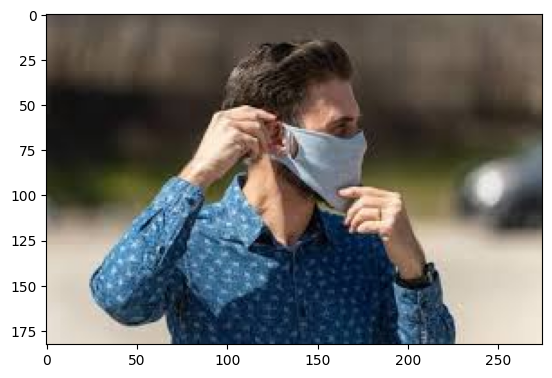

In [25]:
# displying image
images = mping.imread("/content/data/with_mask/with_mask_2590.jpg")
plt.imshow(images)
plt.show

In [44]:
#convert images into numpy arrays
with_mask_path = "/content/data/with_mask/"
data=[]
for imgfile in with_mask_data:
  image = Image.open(with_mask_path+imgfile)
  image = image.resize((128,128))
  image = image.convert("RGB")
  image = np.array(image)
  data.append(image)

without_mask_path = "/content/data/without_mask/"
for imgfile in without_mask_data:
  images = Image.open(without_mask_path+imgfile)
  images = images.resize((128,128))
  images = images.convert("RGB")
  images = np.array(images)
  data.append(images)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [32]:
data[0]
type(data[0])

numpy.ndarray

In [45]:
labels = with_mask_label + without_mask_label
X = np.array(data)
Y = np.array(labels)
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,random_state=2)

In [49]:
x_train_scaled = x_train/255
x_test_scaled = x_test/255
print(x_train_scaled)
print(x_test_scaled)

[[[[0.6        0.6        0.6       ]
   [0.60392157 0.60392157 0.60392157]
   [0.61176471 0.61176471 0.61176471]
   ...
   [0.6        0.60392157 0.61176471]
   [0.59607843 0.59607843 0.60784314]
   [0.58823529 0.59215686 0.6       ]]

  [[0.61568627 0.61568627 0.61568627]
   [0.61568627 0.61568627 0.61568627]
   [0.61960784 0.61960784 0.61960784]
   ...
   [0.61568627 0.61960784 0.62745098]
   [0.61176471 0.61176471 0.61960784]
   [0.60392157 0.60784314 0.61568627]]

  [[0.62745098 0.62745098 0.62745098]
   [0.62745098 0.62745098 0.62745098]
   [0.63137255 0.63137255 0.63137255]
   ...
   [0.63137255 0.63137255 0.63921569]
   [0.62745098 0.62745098 0.63529412]
   [0.62352941 0.62352941 0.63137255]]

  ...

  [[0.69411765 0.69411765 0.69411765]
   [0.69411765 0.69411765 0.69411765]
   [0.69411765 0.69411765 0.69411765]
   ...
   [0.6745098  0.6745098  0.6745098 ]
   [0.6745098  0.6745098  0.67843137]
   [0.67058824 0.67058824 0.67843137]]

  [[0.69411765 0.69411765 0.69411765]
   [0.6

In [10]:
import tensorflow as tf
from tensorflow import keras
nums_of_classes = 2
model = keras.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu',input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),activation='relu',input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))
model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128,activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64,activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(nums_of_classes,activation='sigmoid'))


In [61]:
#compile the numerical network

model.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics=["acc"])

In [63]:
#epochs
history = model.fit(x_train_scaled,y_train,validation_split=0.1,epochs=7)

Epoch 1/7
170/170 [==============================] - 4s 20ms/step - loss: 0.1513 - acc: 0.9439 - val_loss: 0.2049 - val_acc: 0.9240
Epoch 2/7
170/170 [==============================] - 3s 20ms/step - loss: 0.1167 - acc: 0.9564 - val_loss: 0.2674 - val_acc: 0.9174
Epoch 3/7
170/170 [==============================] - 3s 18ms/step - loss: 0.1003 - acc: 0.9603 - val_loss: 0.1873 - val_acc: 0.9322
Epoch 4/7
170/170 [==============================] - 3s 17ms/step - loss: 0.0960 - acc: 0.9632 - val_loss: 0.3188 - val_acc: 0.9107
Epoch 5/7
170/170 [==============================] - 3s 18ms/step - loss: 0.0761 - acc: 0.9726 - val_loss: 0.3328 - val_acc: 0.9140
Epoch 6/7
170/170 [==============================] - 3s 20ms/step - loss: 0.0685 - acc: 0.9765 - val_loss: 0.2385 - val_acc: 0.9289
Epoch 7/7
170/170 [==============================] - 3s 18ms/step - loss: 0.0615 - acc: 0.9737 - val_loss: 0.2599 - val_acc: 0.9405


In [64]:
loss , accuracy = model.evaluate(x_test_scaled,y_test)
print("Test Accuracy = ",accuracy)

48/48 [==============================] - 1s 11ms/step - loss: 0.2308 - acc: 0.9371
Test Accuracy =  0.9371277093887329


Provide the path of the image/content/test_kabins.jpeg


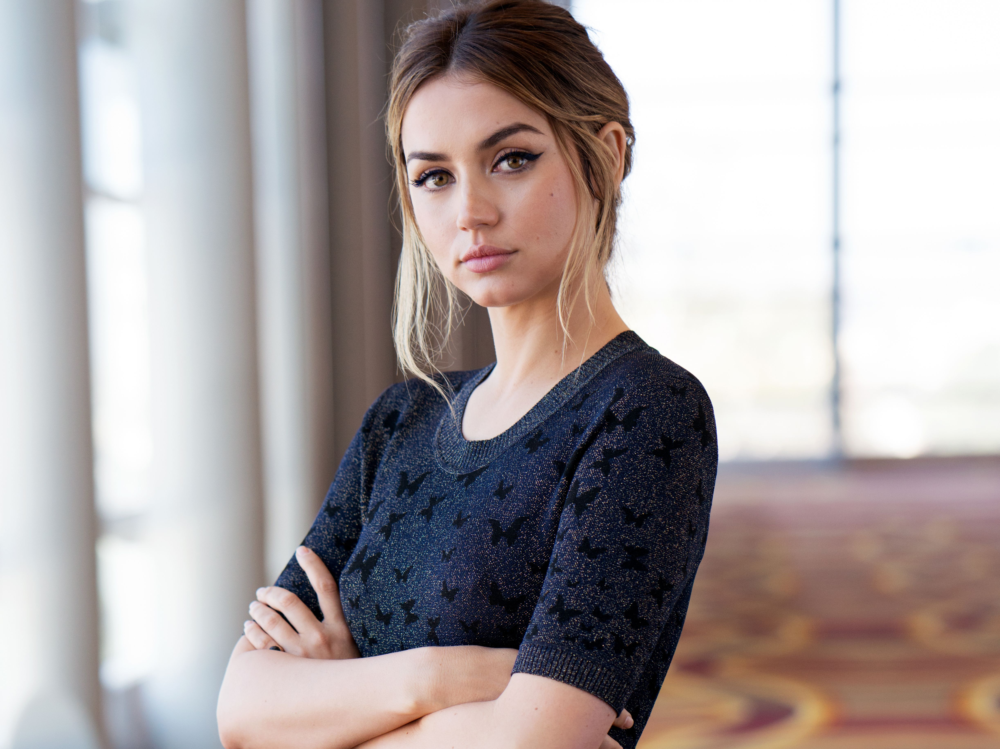

None
1/1 [==============================] - 0s 25ms/step
1
The person is wearing a mask


In [12]:
input_img_path = input("Provide the path of the image")

input_img = cv2.imread(input_img_path)
show = cv2_imshow(input_img)
print(show)
input_img_resized = cv2.resize(input_img,(128,128))

input_img_scaled = input_img_resized/255

input_img_reshaped = np.reshape(input_img_scaled,[1,128,128,3])

input_prediction = model.predict(input_img_reshaped)

input_arg_label = np.argmax(input_prediction)

print(input_arg_label)
if(input_arg_label == 1):
  print("The person is wearing a mask")
else:
  print("The person is not wearing a mask")
